Environment Setup

In [ ]:
!pip install ultralytics opencv-python numpy pandas matplotlib tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 68.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 94.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

Video Mounting

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


create line in video frame

In [ ]:
# Load model
from ultralytics import YOLO # Import the YOLO class

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


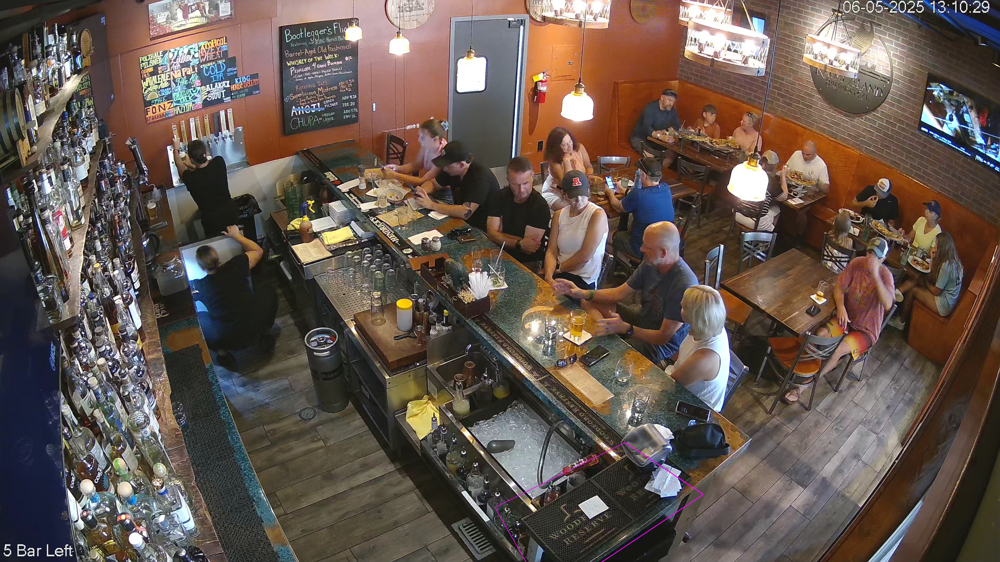

In [ ]:
import cv2
from PIL import Image

video_path = "/content/drive/MyDrive/KoloaVideo/Koloa4.mp4"  # Update with your file path
cap = cv2.VideoCapture(video_path)

# Read the first frame
ret, frame = cap.read()

if ret:
# Define the four corner points of the ROI (example coordinates)
# These coordinates should be in the format [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
# Make sure these points define a convex polygon.
    roi_points = [(1900, 1950), (2400, 1700), (2700, 1900), (2100, 2300)] # Example: a quadrilateral

# You can adjust these coordinates to fit your specific video and desired counting area.

    # Convert roi_points to a numpy array of integers for cv2.polylines
    import numpy as np
    pts = np.array(roi_points, np.int32)
    pts = pts.reshape((-1, 1, 2))

    # Draw the quadrilateral on the frame
    # Color is pink (255, 0, 255), thickness is 2
    cv2.polylines(frame, [pts], True, (255, 0, 255), 2)


    # Save the frame with the line drawn on it
    cv2.imwrite("first_frame_with_roi.jpg", frame)

    # Display the saved frame in the notebook
    display(Image.open("first_frame_with_roi.jpg"))

    # Release the video capture object
    cap.release()
else:
    print("Failed to read video")

In [ ]:
import cv2
from PIL import Image

video_path = "/content/drive/MyDrive/KoloaVideo/Koloa4.mp4"  # Update with your file path
cap = cv2.VideoCapture(video_path)

# Read the first frame
ret, frame = cap.read()

if ret:
# Define the four corner points of the ROI (example coordinates)
# These coordinates should be in the format [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
# Make sure these points define a convex polygon.
    roi_points = [(1900, 1950), (2400, 1700), (2700, 1900), (2100, 2300)] # Example: a quadrilateral

# You can adjust these coordinates to fit your specific video and desired counting area.

    # Convert roi_points to a numpy array of integers for cv2.polylines
    import numpy as np
    pts = np.array(roi_points, np.int32)
    pts = pts.reshape((-1, 1, 2))

    # Draw the quadrilateral on the frame
    # Color is pink (255, 0, 255), thickness is 2
    cv2.polylines(frame, [pts], True, (255, 0, 255), 2)


    # Save the frame with the line drawn on it
    # cv2.imwrite("first_frame_with_roi.jpg", frame)

    # Display the saved frame in the notebook
    # display(Image.open("first_frame_with_roi.jpg"))

    # Release the video capture object
    cap.release()
else:
    print("Failed to read video")

# Load model
from ultralytics import YOLO # Import the YOLO class
model = YOLO("yolo11x.pt") # Using a larger model


drink_classes = [41, 47] # Make sure these class IDs cover all types of drinks in your video

# --- Tunable Hyperparameters ---
confidence_threshold = 0.4 # Increase this value to be more strict about detections
iou_threshold = 0.6 # Adjust this value to change how overlapping boxes are handled
# -------------------------------


# Run tracking
results = model.track(
    source=video_path,
    persist=True,
    conf=confidence_threshold,
    iou=iou_threshold,
    classes=drink_classes,  # Only drinks
    tracker="bytetrack.yaml",
    save=False,
    stream=True,
)

# Video reader and writer
cap = cv2.VideoCapture(video_path)
w, h = int(cap.get(3)), int(cap.get(4))
fps = cap.get(cv2.CAP_PROP_FPS)
out = cv2.VideoWriter("tracked_output.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))

frame_idx = 0
drink_count = 0
counted_ids = set() # Use a set to store IDs of already counted drinks
positions = {} # Dictionary to store the last known position of each tracked object ID

# Define the four corner points of the ROI (example coordinates)
# These coordinates should be in the format [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
# Make sure these points define a convex polygon.
roi_points = [(1900, 1950), (2400, 1700), (2700, 1900), (2100, 2300)] # Example: a quadrilateral

# Convert roi_points to a numpy array of integers for cv2.polylines
import numpy as np
pts = np.array(roi_points, np.int32)
pts = pts.reshape((-1, 1, 2))


for result in results:
    frame = result.orig_img.copy()
    frame_idx += 1

    # Draw the ROI polygon
    cv2.polylines(frame, [pts], True, (255, 0, 255), 2)


    if result.boxes.id is None:
        out.write(frame)
        continue

    ids = result.boxes.id.int().cpu().tolist()
    boxes = result.boxes.xyxy.cpu().numpy()
    clss = result.boxes.cls.cpu().numpy().astype(int)

    for i, id_ in enumerate(ids):
        cls = clss[i]
        if cls not in drink_classes:
            continue

        x1, y1, x2, y2 = boxes[i]
        cx, cy = int((x1 + x2) / 2), int((y1 + y2) / 2)

        # Draw box and ID
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, f"ID:{id_}", (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        # Draw centroid as a pink dot
        cv2.circle(frame, (cx, cy), 5, (255, 0, 255), -1)

        # Check if the centroid is inside the ROI
        is_inside_roi = cv2.pointPolygonTest(pts, (cx, cy), False) >= 0

        # Check if the object was previously tracked and its previous position was outside the ROI
        if id_ in positions:
            prev_cx, prev_cy = positions[id_]
            was_outside_roi = cv2.pointPolygonTest(pts, (prev_cx, prev_cy), False) < 0

            # If the object was outside the ROI and is now inside, and hasn't been counted, increment the count
            if was_outside_roi and is_inside_roi and id_ not in counted_ids:
                drink_count += 1
                counted_ids.add(id_)

        # Update the object's position
        positions[id_] = (cx, cy)


    # Draw counter
    cv2.putText(frame, f"Drink Count: {drink_count}", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 0, 255), 3)

    # Display the frame (this will show the video playing in the notebook)
    #display(Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)))


    out.write(frame)

cap.release()
out.release()
print("✅ Done! Output saved as: tracked_output.mp4")


video 1/1 (frame 1/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 54.8ms
video 1/1 (frame 2/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 53.2ms
video 1/1 (frame 3/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 45.0ms
video 1/1 (frame 4/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 45.0ms
video 1/1 (frame 5/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 45.0ms
video 1/1 (frame 6/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 45.0ms
video 1/1 (frame 7/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 41.8ms
video 1/1 (frame 8/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 40.3ms
video 1/1 (frame 9/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 384x640 (no detections), 43.8ms
video 1/1 (frame 10/1050) /content/drive/MyDrive/KoloaVideo/Koloa4.mp4: 

In [ ]:
from google.colab import files

files.download('tracked_output.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print(model.names)